# THE BRIDGE (Data Science Bootcamp - Agosto 2020)
##  PROYECTO GRUPO D 
________________
### Análisis de datos asociados al COVID-19 del grupo de paises conformado por Portugal, Venezuela, Turquía, Reino Unido y España.

Fuente de datos (Data Set)  [https://covid.ourworldindata.org/data/owid-covid-data.csv]

Team members: 
- ** José Luis Manjon **     presimanjon@yahoo.es        git @JoseLuisManjon
- ** Filipa Teles      **    filipa.teles@icloud.com     git @Filipate
- ** Mónica Villasuso  **    villasuso.monica@gmail.com  git @MVillasuso
_________________

## 1. Librerías requeridas para el análisis (* Import *)
_________

In [1]:
import pandas as pd 
import json 
import seaborn as sns
import numpy as np
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import plotly.express as px 
import plotly.io as pio
import plotly
from datetime import datetime
import os

## 2. Carga de datos inicial, de la fuente, en el dataframe        
## *covid_general*
____________

In [2]:
url = "https://covid.ourworldindata.org/data/owid-covid-data.csv"
covid_general = pd.read_csv(url, sep=",")

## 3. Preparación de los datos - Data wrangling and Data cleaning
________________
Exploración de los datos del dataframe

In [3]:
covid_general.shape

(36984, 36)

In [4]:
covid_general.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36984 entries, 0 to 36983
Data columns (total 36 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   iso_code                         36920 non-null  object 
 1   continent                        36691 non-null  object 
 2   location                         36984 non-null  object 
 3   date                             36984 non-null  object 
 4   total_cases                      36632 non-null  float64
 5   new_cases                        36632 non-null  float64
 6   total_deaths                     36632 non-null  float64
 7   new_deaths                       36632 non-null  float64
 8   total_cases_per_million          36568 non-null  float64
 9   new_cases_per_million            36568 non-null  float64
 10  total_deaths_per_million         36568 non-null  float64
 11  new_deaths_per_million           36568 non-null  float64
 12  new_tests         

In [5]:
covid_general.index

RangeIndex(start=0, stop=36984, step=1)

In [6]:
# Revisión de los datos globales para ver si hay información totalizada (continent or country tienen valor  Null) y eliminarla posteriormente para el análisis
covid_general[(covid_general.continent.isnull()) | (covid_general.iso_code.isnull())]

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
36691,OWID_WRL,NaN,World,2019-12-31,27.0,27.0,0.0,0.0,0.003,0.003,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
36692,OWID_WRL,NaN,World,2020-01-01,27.0,0.0,0.0,0.0,0.003,0.000,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
36693,OWID_WRL,NaN,World,2020-01-02,27.0,0.0,0.0,0.0,0.003,0.000,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
36694,OWID_WRL,NaN,World,2020-01-03,44.0,17.0,0.0,0.0,0.006,0.002,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
36695,OWID_WRL,NaN,World,2020-01-04,44.0,0.0,0.0,0.0,0.006,0.000,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36979,NaN,NaN,International,2020-02-28,705.0,0.0,4.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36980,NaN,NaN,International,2020-02-29,705.0,0.0,6.0,2.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36981,NaN,NaN,International,2020-03-01,705.0,0.0,6.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36982,NaN,NaN,International,2020-03-02,705.0,0.0,6.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Dataframe mundial sin los datos globales (continent) o de países con valor Nan  
### * world_df * 
____________

In [7]:

# DF Mundial sin los datos globales (continent is Nan) o de países Nan
world_df =  covid_general[~((covid_general.continent.isnull()) | (covid_general.iso_code.isnull()))]

In [8]:
world_df.shape          # Se eliminarán las 290 filas con valores Nan

(36691, 36)

In [10]:
world_df["date"]=pd.to_datetime(world_df["date"],format="%Y-%m-%d")


### Ranking con respecto al total de países
What position do your countries occupe respect to the number of total infected, total deaths and total recoveries?
______________

In [11]:
#Ranking diario por países considerando el numero de casos totales (i.e. Total Infected)
world_df["rank_TC"] = world_df.groupby(["date"])["total_cases"].rank(method = "dense", ascending = False)

In [12]:
#Ranking diario por países considerando el numero de muertes (i.e. Total Deaths)
world_df["rank_TD"] = world_df.groupby(["date"])["total_deaths"].rank(method = "dense", ascending = False)

In [13]:
#Ranking diario por países considerando el numero de casos totales por millon de habitantes (i.e. total_cases_per_million)
world_df["rank_TCxM"] = world_df.groupby(["date"])["total_cases_per_million"].rank(method = "dense", ascending = False)

In [14]:
#Ranking diario por países considerando el numero de muertes totales por millon de habitantes (i.e. total_deaths_per_million)
world_df["rank_TDxM"] = world_df.groupby(["date"])["total_deaths_per_million"].rank(method = "dense", ascending = False)

In [15]:
# Lista de las columnas que almacenan la posición del ranking para cada país de acuerdo a cada  variable
cols_rank= ["rank_TC", "rank_TD", "rank_TCxM", "rank_TDxM" ]

### ANÁLISIS CONJUNTO PAISES DEL GRUPO D
### PORTUGAL, VENEZUELA, TURQUÍA, GRAN BRETAÑA y ESPAÑA
________________

### Dataframe de los datos correspondientes a los países del grupo D
### * covid_grupoD *

In [16]:
paises_grupoD=["PRT", "VEN", "TUR", "GBR", "ESP"]
paises_nombres={"PRT":"Portugal", "VEN":"Venezuela", "TUR":"Turquía", "GBR":"Gran Bretaña", "ESP":"España"}
covid_grupoD=world_df[world_df.iso_code.isin(paises_grupoD)]
covid_grupoD


,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,...,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM
26887,PRT,Europe,Portugal,2020-03-01,NaN,NaN,NaN,NaN,NaN,NaN,...,9.85,16.3,30.0,NaN,3.39,82.05,NaN,NaN,NaN,NaN
26888,PRT,Europe,Portugal,2020-03-02,NaN,NaN,NaN,NaN,NaN,NaN,...,9.85,16.3,30.0,NaN,3.39,82.05,NaN,NaN,NaN,NaN
26889,PRT,Europe,Portugal,2020-03-03,2.0,2.0,0.0,0.0,0.196,0.196,...,9.85,16.3,30.0,NaN,3.39,82.05,28.0,8.0,33.0,10.0
26890,PRT,Europe,Portugal,2020-03-04,4.0,2.0,0.0,0.0,0.392,0.196,...,9.85,16.3,30.0,NaN,3.39,82.05,31.0,9.0,35.0,11.0
26891,PRT,Europe,Portugal,2020-03-05,5.0,1.0,0.0,0.0,0.490,0.098,...,9.85,16.3,30.0,NaN,3.39,82.05,31.0,10.0,37.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35919,VEN,South America,Venezuela,2020-08-11,25805.0,0.0,223.0,0.0,907.478,0.000,...,6.47,NaN,NaN,NaN,0.80,72.06,64.0,79.0,117.0,136.0
35920,VEN,South America,Venezuela,2020-08-12,27938.0,2133.0,238.0,15.0,982.489,75.011,...,6.47,NaN,NaN,NaN,0.80,72.06,62.0,78.0,111.0,132.0
35921,VEN,South America,Venezuela,2020-08-13,29088.0,1150.0,247.0,9.0,1022.931,40.442,...,6.47,NaN,NaN,NaN,0.80,72.06,60.0,78.0,111.0,130.0
35922,VEN,South America,Venezuela,2020-08-14,30369.0,1281.0,259.0,12.0,1067.979,45.049,...,6.47,NaN,NaN,NaN,0.80,72.06,60.0,76.0,110.0,132.0


In [17]:
# Fecha mínima en la que aparecen valores reportados en el dataframe
covid_grupoD["date"].min()

Timestamp('2019-12-31 00:00:00')

In [18]:
#Selección de los registros a partir de la fecha en que comenzaron a reportar  datos de COVID
covid_grupoD[covid_grupoD["date"] == covid_grupoD["date"].min()]

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,...,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM
31023,ESP,Europe,Spain,2019-12-31,0.0,0.0,0.0,0.0,0.0,0.0,...,7.17,27.4,31.4,NaN,2.97,83.56,2.0,1.0,2.0,1.0
34708,GBR,Europe,United Kingdom,2019-12-31,0.0,0.0,0.0,0.0,0.0,0.0,...,4.28,20.0,24.7,NaN,2.54,81.32,2.0,1.0,2.0,1.0


 *NOTA: A pesar de que tanto España como el Reino Unido tienen registros desde el 31/12/2019, estos No contienen información relacionada al Covid 19*

In [19]:
covid_grupoD.new_cases.value_counts(dropna = False).sum()

933

In [20]:
# Crear un DF con las filas de datos que No contienen informacion del COVID
nocovid_grupoD = covid_grupoD[(covid_grupoD["new_cases"]==0) & (covid_grupoD["total_cases"] ==0)]
# Eliminar del DF las filas que NO contienen info del COVID
covid_grupoD=covid_grupoD.drop(covid_grupoD[(covid_grupoD["new_cases"]==0) & (covid_grupoD["total_cases"] ==0)].index)

In [21]:
nocovid_grupoD.shape

(64, 40)

In [22]:
covid_grupoD.shape

(869, 40)

In [23]:
# Verificar si hay alguna columna donde TODOS sus datos sean nulos y por lo tanto no aporte información al análisis
covid_grupoD.isnull().sum()

iso_code                             0
continent                            0
location                             0
date                                 0
total_cases                          2
new_cases                            2
total_deaths                         2
new_deaths                           2
total_cases_per_million              2
new_cases_per_million                2
total_deaths_per_million             2
new_deaths_per_million               2
new_tests                          446
total_tests                        416
total_tests_per_thousand           416
new_tests_per_thousand             446
new_tests_smoothed                 332
new_tests_smoothed_per_thousand    332
tests_per_case                     334
positive_rate                      334
tests_units                        304
stringency_index                    23
population                           0
population_density                   0
median_age                           0
aged_65_older            

In [24]:
# Eliminar la columna handwashing_facilities pues no contiend informacion
covid_grupoD.drop(columns=["handwashing_facilities"], axis = 1, inplace=True)

In [25]:
# Validación de la fecha mínima en que cada pais del grupo reporta información de Covid19
covid_grupoD.groupby("iso_code")["date"].min()

iso_code
ESP   2020-02-01
GBR   2020-02-01
PRT   2020-03-01
TUR   2020-03-12
VEN   2020-03-15
Name: date, dtype: datetime64[ns]

In [26]:
# Validación de la fecha máxima en que cada pais del grupo reporta información de Covid19
covid_grupoD.groupby("iso_code")["date"].max()

iso_code
ESP   2020-08-14
GBR   2020-08-15
PRT   2020-08-15
TUR   2020-08-15
VEN   2020-08-15
Name: date, dtype: datetime64[ns]

In [27]:
covid_grupoD.reset_index(inplace=True)

### Período de estado de alarma por país del grupo D y carga en un dataframe
(Fuentes:
- España, Gran Bretaña y Portugal
 https://www.cidob.org/biografias_lideres_politicos/organismos/union_europea/covid_19_la_respuesta_de_europa_contra_la_pandemia)

- Venezuela
 https://cronica.uno/publicado-en-gaceta-oficial-decreto-que-extiende-hasta-junio-estado-de-alarma-por-covid-19/
- Turquía
 https://elpais.com/sociedad/2020-04-10/el-aumento-de-casos-de-coronavirus-empuja-al-gobierno-turco-a-declarar-un-toque-de-queda-durante-el-fin-de-semana.html
 
*NOTA: En Turquía no se ha decretado oficialmente el estado de alarme, pero se han tomado medidas de contención con el objetivo de contener la propagación del virus* 

### * alarm_dates * 

In [28]:
alarm_dicc = {'iso_code': ["ESP", "PRT", "VEN", "GBR", "TUR"],
        'alarm_init': ['2020-03-14', '2020-03-13', '2020-03-13', '2020-03-23',np.NaN],
        'alarm_end': ['2020-06-21', '2020-06-01', '2020-07-11', '2020-07-04', np.NaN]
       }
alarm_dates = pd.DataFrame(alarm_dicc, columns = ['iso_code', 'alarm_init', 'alarm_end'])

alarm_dates

,iso_code,alarm_init,alarm_end
0,ESP,2020-03-14,2020-06-21
1,PRT,2020-03-13,2020-06-01
2,VEN,2020-03-13,2020-07-11
3,GBR,2020-03-23,2020-07-04
4,TUR,NaN,NaN


## 4. Análisis de tendencias en los datos (EDA)
________________

In [29]:
covid_grupoD.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 869 entries, 0 to 868
Data columns (total 40 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   index                            869 non-null    int64         
 1   iso_code                         869 non-null    object        
 2   continent                        869 non-null    object        
 3   location                         869 non-null    object        
 4   date                             869 non-null    datetime64[ns]
 5   total_cases                      867 non-null    float64       
 6   new_cases                        867 non-null    float64       
 7   total_deaths                     867 non-null    float64       
 8   new_deaths                       867 non-null    float64       
 9   total_cases_per_million          867 non-null    float64       
 10  new_cases_per_million            867 non-null    float64      

In [30]:
#Lista de las columnas de datos para graficarlas y contrastar la tendencia entre los países del grupo D
cols = list(covid_grupoD.columns.values[[5,6,7,8,9,10,11,12,13,14,15,16,17,18,36,37,38,39]])
cols

['total_cases',
 'new_cases',
 'total_deaths',
 'new_deaths',
 'total_cases_per_million',
 'new_cases_per_million',
 'total_deaths_per_million',
 'new_deaths_per_million',
 'new_tests',
 'total_tests',
 'total_tests_per_thousand',
 'new_tests_per_thousand',
 'new_tests_smoothed',
 'new_tests_smoothed_per_thousand',
 'rank_TC',
 'rank_TD',
 'rank_TCxM',
 'rank_TDxM']

_________
### 4.1 ANÁLISIS GLOBAL GRUPO D : Visualización de los 5 países en una gráfica por cada columna de datos
_________

### FUNCIONES  A COLOCAR EN LIBRERIA .py

In [31]:
# Guarda el resultado del gráfico dentro  del directorio indicado (creándolo si no existe)
def salvar_plot (dir_name, f_name):

    """ Guarda el archivo como .PNG en el directorio indicado """

    results_dir = os.path.join(dir_name) 
    if not os.path.isdir(results_dir): 
        os.makedirs(results_dir) 
    plt.savefig(results_dir + f_name,bbox_inches='tight') 

def salvarI_plot (fig, dir_name, f_name):

    """ Guarda el archivo dinámico como HTML en el directorio indicado """

    results_dir = os.path.join(dir_name) 
    if not os.path.isdir(results_dir): 
        os.makedirs(results_dir) 
    plotly.offline.plot(fig, filename= results_dir + f_name, auto_open = False)
 

In [79]:
# Función para mostrar un gráfico ESTÁTICO con el valor de una columna de datos en un gráfico de líneas (1 por país)

def graf_grupo (x_val, y_val, hue_val, df, inv_y): 
    fig= plt.figure(figsize =(30,10))
    g = sns.relplot(x =x_val, y = y_val, hue = hue_val, kind = "line", data = df, palette = "Paired")
    g._legend.texts[0].set_text("")
    g._legend.set_title("Country")
    plt.xticks(rotation = "vertical")
    tit = y_val.replace("_"," ").title() + " by Date and Country - Group D"
    plt.title(tit)

    file_name = y_val+ "_x_C_D" +  ".png"
    salvar_plot ( "../resources/plots/TOT_D/", file_name)

    if inv_y:
        plt.gca().invert_yaxis()
    plt.show()

    

In [80]:
# Función para mostrar un gráfico INTERACTIVO con el valor de una columna de datos en un gráfico de líneas (1 por país)

def grafI_grupo (x_val, y_val, hue_val, df, inv_y): 
    tit = y_val.replace("_"," ").title() + " by Date and Country - Group D"
    fig = px.line(df, x=x_val, y=y_val, color=hue_val, line_group=hue_val, hover_name=hue_val,
        line_shape="spline", render_mode="svg")
    fig.update_layout(     
            title = {"text" : tit, "x":0.5, "xanchor":"center"}, 
            xaxis_title = x_val.title(),
            yaxis_title = y_val.replace("_"," ").title(),
            #plot_bgcolor="white",
            legend=dict(title= "Country", y=0.5, font_size=12)
                    )
    file_name = y_val+ "_x_C_D"
    salvarI_plot(fig,"../resources/plots/TOT_D/", file_name)
    fig.show()


In [81]:
def graf_pais (ccode,col_dat, cname,cdf, y_maximo):
    if y_maximo:
        eje_y = cdf.total_cases.max()
        tit =  " Covid19  Totals - " + cname.title()
        filen= "Tot_"
    else:
        eje_y = cdf.rank_TCxM.max()
        tit =  " COVID19  Ranking - " + cname.title()
        filen= "Rank_"
    fg = cdf.plot(x="date", y= col_dat, kind="line", figsize=(12,8))
    fg.set_title(tit, fontsize=20)
    fg.legend(bbox_to_anchor=(1.3, 0.5))
    plt.vlines(alarm_dates.alarm_init[alarm_dates.iso_code == ccode].to_frame().iloc[0,0], ymin=0, ymax=eje_y, color = "r", linestyles =":")
    plt.vlines(alarm_dates.alarm_end[alarm_dates.iso_code == ccode].to_frame().iloc[0,0], ymin=0, ymax=eje_y, color = "r", linestyles =":")
    filen=filen+ ccode+".png"
    dirn = "../resources/plots/"+ ccode+ "/"
    salvar_plot(dirn, filen)
    plt.show()

In [85]:
def grafI_pais (ccode,col_dat, cname,cdf, y_maximo):
    if y_maximo:
        eje_y = cdf.total_cases.max()
        tit =  " Covid19  Totals - " + cname.title()
        filen= "Tot_"
    else:
        eje_y = cdf.rank_TCxM.max()
        tit =  " COVID19  Ranking - " + cname.title()
        filen= "Rank_"

    fig = px.line(cdf, x="date", y=col_dat, line_shape="spline", render_mode="svg")
    fig.update_layout(     
            title = {"text" : tit, "x":0.4, "xanchor":"center"}, 
            xaxis_title = "Date",
            yaxis_title = "Totals",
            #plot_bgcolor="white",
            legend=dict(title= " ", y=0.5, font_size=12)
                    )
    fig.add_shape(
        dict(
        type= "line",
        x0 = alarm_dates.alarm_init[alarm_dates.iso_code==ccode].fillna("01-03-2020").values[0],
        y0 = 0,
        x1 = alarm_dates.alarm_init[alarm_dates.iso_code==ccode].fillna("01-03-2020").values[0],
        y1 = eje_y, #df[col_dat[0]].max(),
        line  = dict (color = "Purple", width = 2, dash = "dot")
        ))
    fig.add_shape(
        dict(
        type= "line",
        x0 = alarm_dates.alarm_end[alarm_dates.iso_code==ccode].fillna("31-12-2020").values[0],
        y0 = 0,
        x1 = alarm_dates.alarm_end[alarm_dates.iso_code==ccode].fillna("31-12-2020").values[0],
        y1 = eje_y, #df[col_dat[0]].max(),
        line  = dict (color = "Purple", width = 2, dash = "dot")
        ))

    filen=filen+ ccode
    dirn = "../resources/plots/"+ ccode+ "/"
    salvarI_plot(fig, dirn, filen)
    fig.show()

In [76]:
def graf_daily(n1,c1,n2,c2,ccode,df, cname):
    fig = go.Figure(data=[
        go.Bar(name= n1, x=df['date'], y=df[c1]),
        go.Bar(name= n2, x=df['date'], y=df[c2])])
    # Change the bar mode
    fig.update_layout(
                    barmode='overlay', 
                    title={ "text":"Covid19  Daily Cases and Daily Deaths - " + cname.title(), "x":0.42, "xanchor": "center"},
                    xaxis_title = "Date",
                    yaxis_title = "Totals",
                    #plot_bgcolor="white",
                    legend=dict(title= " ", y=0.5, font_size=12)
                    )
    fig.add_shape(
        dict(
        type= "line",
        x0 = alarm_dates.alarm_init[alarm_dates.iso_code==ccode].fillna("01-03-2020").values[0],
        y0 = 0,
        x1 = alarm_dates.alarm_init[alarm_dates.iso_code==ccode].fillna("01-03-2020").values[0],
        y1 = df[c1].max(),
        line  = dict (color = "Purple", width = 2, dash = "dot")
        ))
    fig.add_shape(
        dict(
        type= "line",
        x0 = alarm_dates.alarm_end[alarm_dates.iso_code==ccode].fillna("31-12-2020").values[0],
        y0 = 0,
        x1 = alarm_dates.alarm_end[alarm_dates.iso_code==ccode].fillna("31-12-2020").values[0],
        y1 = df[c1].max(),
        line  = dict (color = "Purple", width = 2, dash = "dot")
        ))

    filen="Daily_"+ ccode
    dirn = "../resources/plots/"+ ccode+ "/"
    salvarI_plot(fig, dirn, filen)
    fig.show()

In [77]:
def graf_dailyd(n2,c2,ccode,df, cname):
    fig = go.Figure(data=[
        go.Bar(name= n2, x=df['date'], y=df[c2])])
    # Change the bar mode
    fig.update_layout(
                barmode='overlay', 
                title={ "text":"Covid19  Daily Deaths - " + cname.title(), "x":0.42, "xanchor": "center"},
                xaxis_title = "Date",
                yaxis_title = "Totals",
                #plot_bgcolor="white",
                legend=dict(title= " ", y=0.5, font_size=12)
                )
    if ccode == "ESP":
        df= df[(df.new_deaths > 0) & (df.date<"2020-05-24")]
    else:
        df = df[(df.new_deaths > 0)]
    fig.add_shape(
        dict(
        type= "line",
        x0 = df["date"][(df[c2] == df[c2].min())].max(),
        y0 = 0,
        x1 = df["date"][(df[c2] == df[c2].min())].max(),
        y1 = df[c2].max(),
        line  = dict (color = "Red", width = 3, dash = "dashdot")
    ))
    fig.add_shape(
        dict(
        type= "line",
        x0 = df["date"][(df[c2] == df[c2].max())].min(),
        y0 = 0,
        x1 = df["date"][(df[c2] == df[c2].max())].min(),
        y1 = df[c2].max(),
        line  = dict (color = "Green", width = 3, dash = "dashdot")
    ))
    filen="Deaths_"+ ccode
    dirn = "../resources/plots/"+ ccode+ "/"
    salvarI_plot(fig, dirn, filen)
    fig.show()

In [75]:
def grafI_area (df,xval,yval,colval,gval):
    fig = px.area(df,x=xval,y=yval,color=colval,line_group=gval)
    fig.update_layout(
    title = {"text" :yval.replace("_", " ").title() + " per continent - Area Graph", "x":0.4, "xanchor": "center"},
    xaxis_title=xval.title(),
    yaxis_title= yval.replace("_", " ").title(),
    legend_title=colval.title(),
    font=dict(
        size=12))
    file_name = yval+ "_x_cont_area"
    salvarI_plot(fig,"../resources/plots/TOT_CONT/", file_name)
    fig.show()


In [43]:
def grafI_bar(df,xval,yval,col,mod, tit):
    fig = px.bar(sig,x = xval,y = yval , color= col, barmode= mod)
    fig.update_layout(
        title = {"text" : tit, "x":0.5, "xanchor": "center"},
        xaxis_title=  xval.title(),
        yaxis_title= yval.replace("_", " ").title(),
        legend_title= " ",
        font=dict(
            size=12))
    file_name = yval+ "_gD_bar"
    salvarI_plot(fig,"../resources/plots/TOT_D/", file_name)
    fig.show()

In [103]:
def grafI_mm (df,wdf,col,mod,hov,sca):
    fig = px.choropleth(df, locations=wdf[hov],
                    color=df[col],locationmode=mod, 
                    hover_name=df[hov], 
                    color_continuous_scale=sca,
                    template='plotly_white')

    fig.update_layout(
        title = {"text" : col.replace("_", " ").title() + " per Country - World Map", "x":0.5, "xanchor": "center"},
        font=dict(
            size=12
        )
    )
    file_name = col+ "_World_map"
    salvarI_plot(fig,"../resources/plots/TOT_W/", file_name)
    fig.show()

In [44]:
def grafI_pie (df, col, val):
    df2= df[df.date==df.date.max()]
    df2.loc[(df2[col] < val), 'location'] = "Others"
    fig = px.pie(df2, values=col, names='location', title="WORLD "+ col.replace("_", " ").title() + " - Covid19")
    file_name = col+ "_World_pie"
    salvarI_plot(fig,"../resources/plots/TOT_W/", file_name)
    fig.show()

In [47]:
def grafI_pieD_O(df, col,paises):

    df2 = df[df.date==df.date.max()]
    df2.loc[~df2["iso_code"].isin(paises), 'location'] = "Other countries"
    fig = px.pie(df2, values=col, names='location')
    fig.update_layout(     
            title = {"text" : "Group D and Others "+ col.replace("_"," ").title() + " - Covid19", "x": 0.7, "xanchor":"center"})
    file_name = col+ "_gDO_pie"
    salvarI_plot(fig,"../resources/plots/TOT_D/", file_name)    
    fig.show()


In [48]:
def grafI_pieD(df, col):
    df2 = df[df.date==df.date.max()]
    fig = px.pie(df2, values= col, names='location', title=col.replace("_"," ").title() + " - Group D")
    file_name = col+ "_gD_pie"
    salvarI_plot(fig,"../resources/plots/TOT_D/", file_name)
    fig.show()


In [49]:
# Posición de los países del grupo D en el ranking mundial 
def graf_rank_D(datf):
    df = datf[datf.date==datf.date.max()]
    fig = go.Figure(data=[
        go.Bar(name='Position - Total Cases', x=df['location'], y=df['rank_TC']),
        go.Bar(name='Position - Total Deaths', x=df['location'], y=df['rank_TD']),
        go.Bar(name='Position - Total Cases x million', x=df['location'], y=df['rank_TCxM']),
        go.Bar(name='Position - Total Deaths x million', x=df['location'], y=df['rank_TDxM'])
        ])
    fig.update_layout(barmode='group', title='Group D Position World Ranking  - Covid19')
    file_name = "rank_gD_bar"
    salvarI_plot(fig,"../resources/plots/TOT_D/", file_name)
    fig.show()

In [66]:
# Outliers
def graf_outlD(datf, col):
    sns.set(style="ticks", palette="bright")
    sns.boxplot(x="location", y=col,
                palette=["m", "g", "b", "r", "y"],
                data=datf)
    file_name = col+ "_gD_box"
    salvar_plot("../resources/plots/TOT_D/", file_name)
    sns.despine(offset=10, trim=True)
    plt.show()

In [52]:
def grafI_line(df, xval, yval,col):
    fig = px.line(df, x=xval, y=yval, color=col, line_group=col, hover_name=col,
        line_shape="spline", render_mode="svg")

    fig.update_layout(
        title = {"text" : yval.replace("_", " ").title() + " per country - Group D", "x":0.4, "xanchor": "center"},
        xaxis_title="Date",
        yaxis_title="Mortality rate (%)",
        legend_title="Country",
        font=dict(
            size=12
        )
    )
    file_name = yval+ "_gD_line"
    salvarI_plot(fig,"../resources/plots/TOT_D/", file_name)
    fig.show()

In [53]:
def grafI_prog(df,xval,yval, tit,t):
    fig = px.line(df, x=xval, y= yval)
    fig.update_layout(
        title = {"text" : tit, "x":0.5, "xanchor": "center"},
        xaxis_title=  xval.title(),
        yaxis_title= yval.replace("_", " ").title(),
        font=dict(
            size=12))
    file_name = yval+ "_" + t + "_"+ "prog"
    if t == "W":
        salvarI_plot(fig,"../resources/plots/TOT_W/", file_name)
    else:
        salvarI_plot(fig,"../resources/plots/TOT_D/", file_name)
    fig.show()

_____________

### PIE CHARTS

In [54]:
grafI_pie(world_df, "total_cases", 300000)

In [55]:
grafI_pie(world_df, "total_deaths", 15000)

In [56]:
grafI_pieD_O(world_df,"total_cases", paises_grupoD)

In [57]:
grafI_pieD_O(world_df,"total_deaths", paises_grupoD)

In [58]:
grafI_pieD(covid_grupoD, "total_cases")

In [59]:
grafI_pieD(covid_grupoD, "total_deaths")

### RANKING

In [60]:
# Posición de los países del grupo D en el ranking mundial 
graf_rank_D(covid_grupoD)

### OUTLIERS ANALYSIS

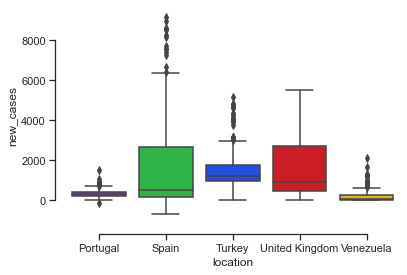

In [67]:
# Boxplot para mostrar casos diarios por pais
graf_outlD(covid_grupoD,"new_cases")


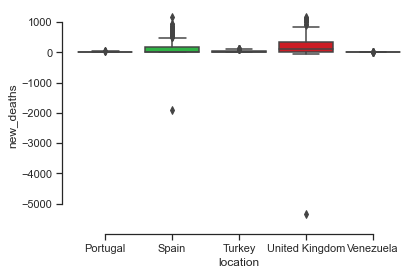

In [68]:
# Boxplot para mostrar muertes diarias por pais
graf_outlD(covid_grupoD,"new_deaths")


### TENDENCIAS

In [71]:
for elem in cols:
    grafI_grupo("date" , elem , "iso_code", covid_grupoD, False )

______________
### 4.2 ANÁLISIS INDIVIDUAL POR PAÍS GRUPO D
Show different tendencies for each column in your dataset. Show, vertically, the start date and end date of the alarm state in each plot
______________

### GRÁFICOS POR PAÍS CON REFERENCIA A LAS FECHAS DE ESTADO DE ALARMA
- CASOS TOTALES y MUERTES TOTALES
- RANKING (EVOLUCIÓN DE LA POSICIÓN DESDE EL INICIO DE LA PANDEMIA)
- CASOS DIARIOS Y MUERTES DIARIAS
- MUERTES DIARIAS y MOMENTO EN QUE LA CURVA CRECE Y DECRECE

__________________

In [86]:
sns.set()
sns.set_style("darkgrid")
col_dat1 = ["total_cases", "total_deaths", "total_cases_per_million"]
col_dat2 = [ "rank_TC", "rank_TD", "rank_TCxM", "rank_TDxM"]
for elem in paises_grupoD:
    df = covid_grupoD[covid_grupoD.iso_code==elem]
    grafI_pais(elem, col_dat1, paises_nombres[elem], df, True)
    grafI_pais(elem, col_dat2, paises_nombres[elem], df, False) 
    graf_daily ('New daily cases',"new_cases", 'Daily deaths', "new_deaths", elem ,df, paises_nombres[elem] )
    graf_dailyd ('Daily deaths', "new_deaths", elem ,df, paises_nombres[elem] )



In [87]:
#Dataframe con información resumida de datos referenciales por país
datos_paises = covid_grupoD.iloc[:,[1,23,24,29,30,32,33]].drop_duplicates()

In [88]:
datos_paises.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5 entries, 0 to 716
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   iso_code               5 non-null      object 
 1   population             5 non-null      float64
 2   population_density     5 non-null      float64
 3   extreme_poverty        4 non-null      float64
 4   cardiovasc_death_rate  5 non-null      float64
 5   female_smokers         4 non-null      float64
 6   male_smokers           4 non-null      float64
dtypes: float64(6), object(1)
memory usage: 320.0+ bytes


In [89]:
datos_paises

,iso_code,population,population_density,extreme_poverty,cardiovasc_death_rate,female_smokers,male_smokers
0,PRT,10196707.0,112.371,0.5,127.842,16.3,30.0
168,ESP,46754783.0,93.105,1.0,99.403,27.4,31.4
364,TUR,84339067.0,104.914,0.2,171.285,14.1,41.1
519,GBR,67886004.0,272.898,0.2,122.137,20.0,24.7
716,VEN,28435943.0,36.253,NaN,204.850,NaN,NaN


### VARIACIÓN DEL STRINGENCY INDEX POR PAÍS
*Stringency Index: The Government Response Stringency Index is a composite measure based on nine response indicators including school closures, workplace closures, and travel bans, rescaled to a value from 0 to 100 (100 = strictest response).*

In [90]:
StrIdx_country = covid_grupoD.loc[:,["date","iso_code",  "stringency_index"]]
StrIdx_country = StrIdx_country[(StrIdx_country.stringency_index>0)]

In [91]:
sig = StrIdx_country.groupby([StrIdx_country.date.dt.month, "iso_code"]).stringency_index.mean().to_frame()
sig.reset_index(inplace=True)
sig['date'] = pd.to_datetime('2020-' + sig.date.astype(int).astype(str) + '-1', format = '%Y-%m')

In [92]:
grafI_bar(sig,xval = "date",yval = "stringency_index" , col= "iso_code", mod= "group", tit= "Stringency Index per country  (Monthly mean) - Group D")

###   ANÁLISIS POR CONTINENTE

In [93]:
world_df.continent.value_counts()

Europe           9986
Asia             9047
Africa           8414
North America    5659
South America    2196
Oceania          1389
Name: continent, dtype: int64

In [94]:
grafI_area(world_df, "date", "total_deaths","continent","iso_code")

In [95]:
grafI_area(world_df, "date", "new_deaths","continent","iso_code")

In [96]:
grafI_area(world_df, "date", "total_cases","continent","iso_code")

In [97]:
grafI_area(world_df, "date", "new_cases","continent","iso_code")

### ÍNDICE DE MORTALIDAD POR PAÍS - GRUPO D
*Según la tasa de mortalidad  calculada como expresión porcentual de total de muertes / total de casos*

In [98]:

covid_grupoD['mortality_rate'] = round((covid_grupoD['total_deaths']/covid_grupoD['total_cases'])*100, 2)

In [99]:
grafI_line(covid_grupoD,xval="date", yval="mortality_rate", col="location" )

### MUERTES TOTALES EN EL MUNDO (MAPA)

In [100]:
world_df_map = (world_df.groupby('location')['total_cases'].max()).to_frame()
world_df_map['index'] = world_df_map.index
world_df_map.rename(columns={'index': 'country'}, inplace=True)

In [101]:
world_df_map_td = (world_df.groupby('location')['total_deaths'].max()).to_frame()
world_df_map_td['index'] = world_df_map_td.index
world_df_map_td.rename(columns={'index': 'country'}, inplace=True)

In [104]:
grafI_mm(world_df_map,world_df_map,"total_cases", "country names", "country", "darkmint")

In [105]:
grafI_mm(world_df_map_td,world_df_map,"total_deaths", "country names", "country", "peach")

_________
### 4.3 PROGRESSION 
______________
How is the progression going each ten days (of the daily infected rate)?

In [106]:
covid_grupoD_date_indice=(covid_grupoD.set_index('date')).groupby(['date','location'])['new_cases','new_deaths'].sum()
covid_grupoD_10days = covid_grupoD_date_indice.resample('10D', level=0).sum().reset_index()

In [107]:
grafI_prog(covid_grupoD_10days, xval= "date", yval = "new_cases",tit = "Group D - 10 days Progression (Daily infected cases)",t="gD")

In [108]:
grafI_prog(covid_grupoD_10days, xval= "date", yval = "new_deaths",tit = "Group D - 10 days Progression (Daily Deaths)",t="gD")

In [109]:
world_df_date_indice=(world_df.set_index('date')).groupby(['date','location'])['new_cases','new_deaths'].sum()
world_df_10days = world_df_date_indice.resample('10D', level=0).sum().reset_index()

In [110]:
grafI_prog(world_df_10days, xval= "date", yval = "new_cases",tit = "World - 10 days Progression (Daily infected Cases)",t="W")

In [111]:
grafI_prog(world_df_10days, xval= "date", yval = "new_deaths",tit = "World - 10 days Progression (Daily deaths)",t="W")

_________
### 4.4 ANÁLISIS DE CORRELACIÓN
______________

In [112]:
#Matriz de correlación entre variables
grupoD_corr = covid_grupoD.iloc[:,np.r_[1,5,7,9,11,22:36]]     #Un subconjunto de las variables a contrastar

In [113]:
grupoD_corr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 869 entries, 0 to 868
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   iso_code                    869 non-null    object 
 1   total_cases                 867 non-null    float64
 2   total_deaths                867 non-null    float64
 3   total_cases_per_million     867 non-null    float64
 4   total_deaths_per_million    867 non-null    float64
 5   stringency_index            846 non-null    float64
 6   population                  869 non-null    float64
 7   population_density          869 non-null    float64
 8   median_age                  869 non-null    float64
 9   aged_65_older               869 non-null    float64
 10  aged_70_older               869 non-null    float64
 11  gdp_per_capita              869 non-null    float64
 12  extreme_poverty             716 non-null    float64
 13  cardiovasc_death_rate       869 non

In [114]:
grupoD_corr.shape

(869, 19)

### Correlación Países del Grupo D

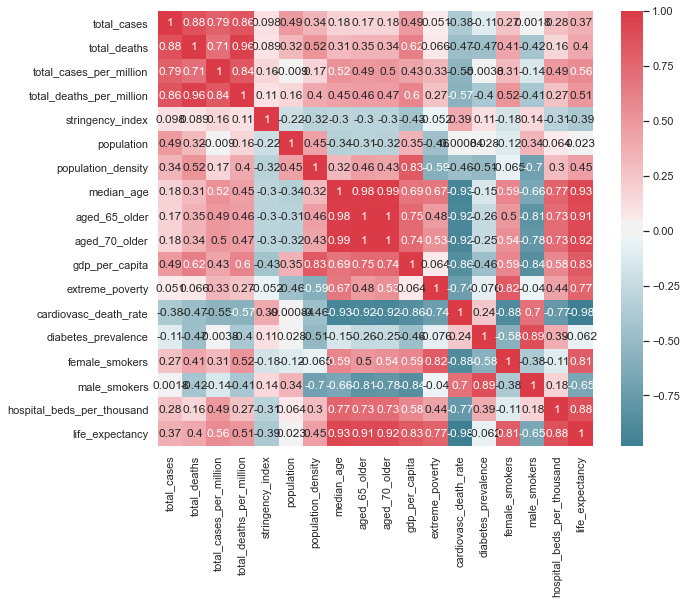

In [115]:
# Mapa de calor
f, ax = plt.subplots(figsize=(10, 8)) 
corr = grupoD_corr.corr() 
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True), 
      square=True, ax=ax, annot=True) 

### Correlación - Todos los países


In [116]:
#Seleccion del DF mundial del subconjunto de las variables a correlacionar
world_df_corr = world_df.iloc[:,np.r_[0,4,6,8,10,21:33,34:36]]    

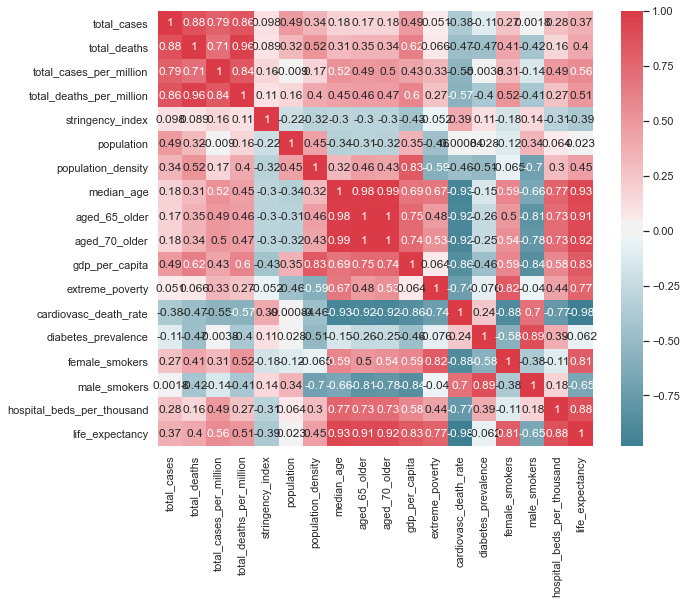

In [117]:
#Mapa de calor de la matriz de correlación 
f, ax = plt.subplots(figsize=(10, 8)) 
corr2 = world_df_corr.corr() 
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True), 
      square=True, ax=ax, annot=True) 

### PENDIENTE


- UNIFICAR LOS COLORES QUE REPRESENTAN LOS PAÍSES EN TODAS LAS 
- EXTRAER A UNA LIBRERIA LAS FUNCIONES DE GRAFICAR

